In [15]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append("..")

import numpy as np
import matplotlib.pyplot as plt
from datasets import Darcy1dDataset
import matplotlib.animation as animation
import torch
from context._noise import Noise
from matplotlib.lines import Line2D
import matplotlib.patches as patches
plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.dpi'] = 600
plt.style.use('seaborn-v0_8-whitegrid')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [16]:
ds = Darcy1dDataset(loc="../data/darcy_1d/", phase="test")

In [17]:
good_ones = [20, 4, 1, 84]

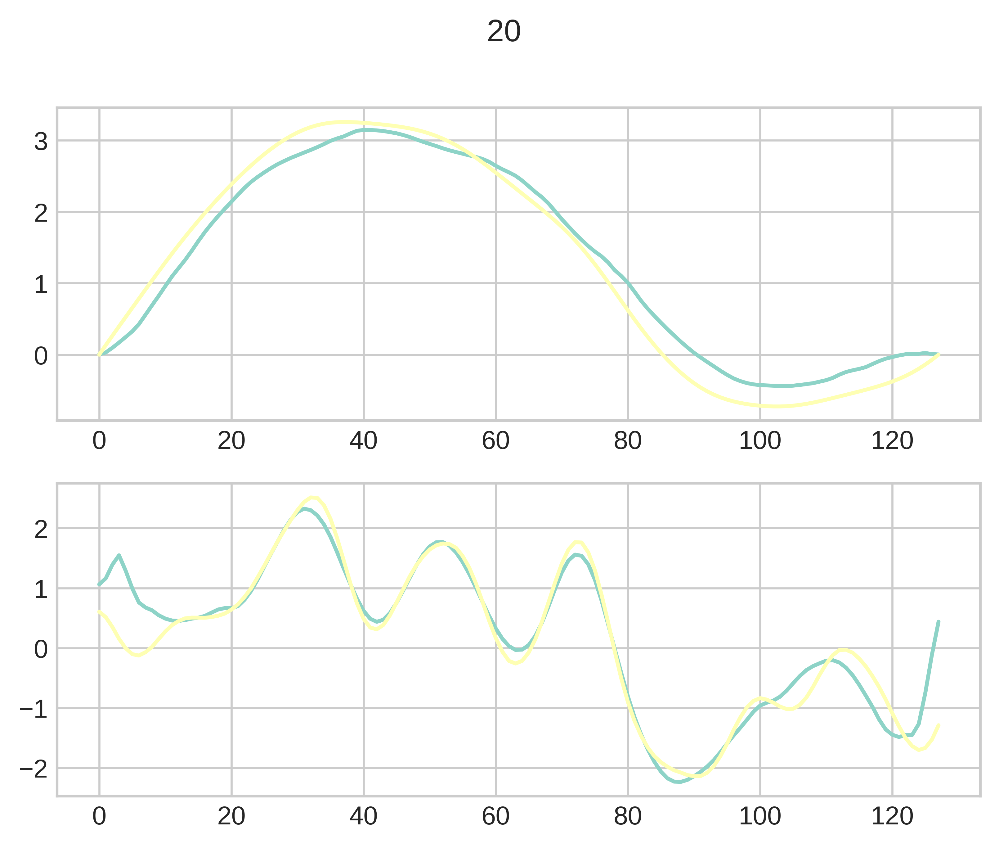

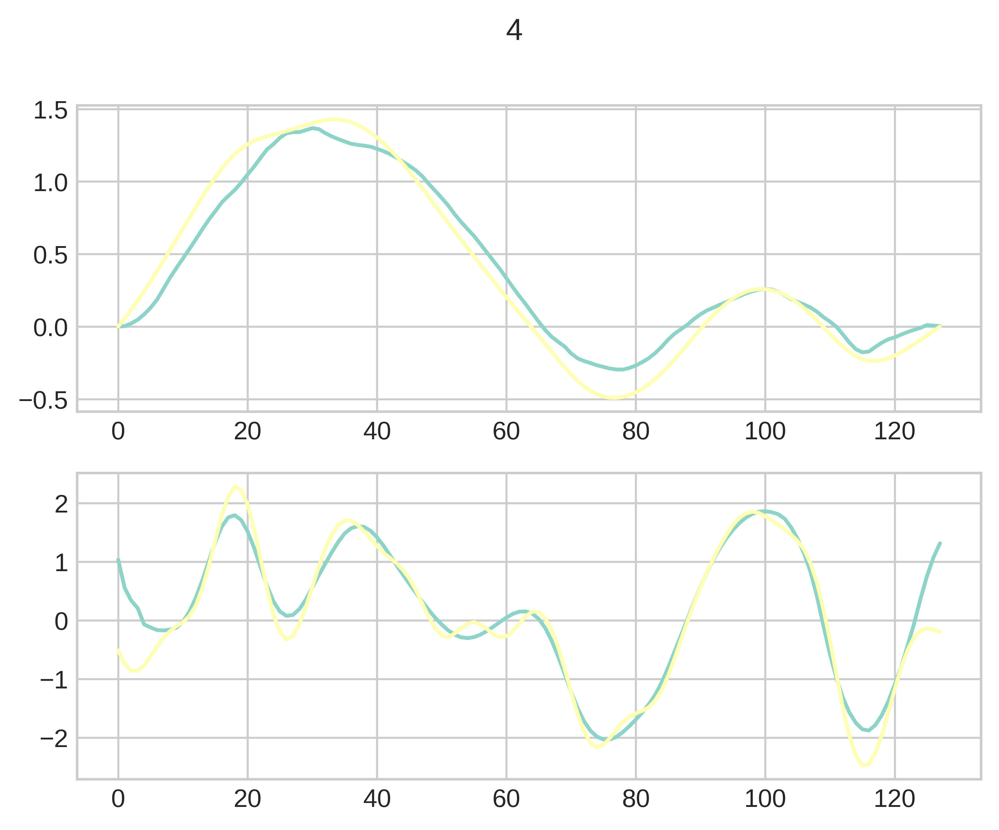

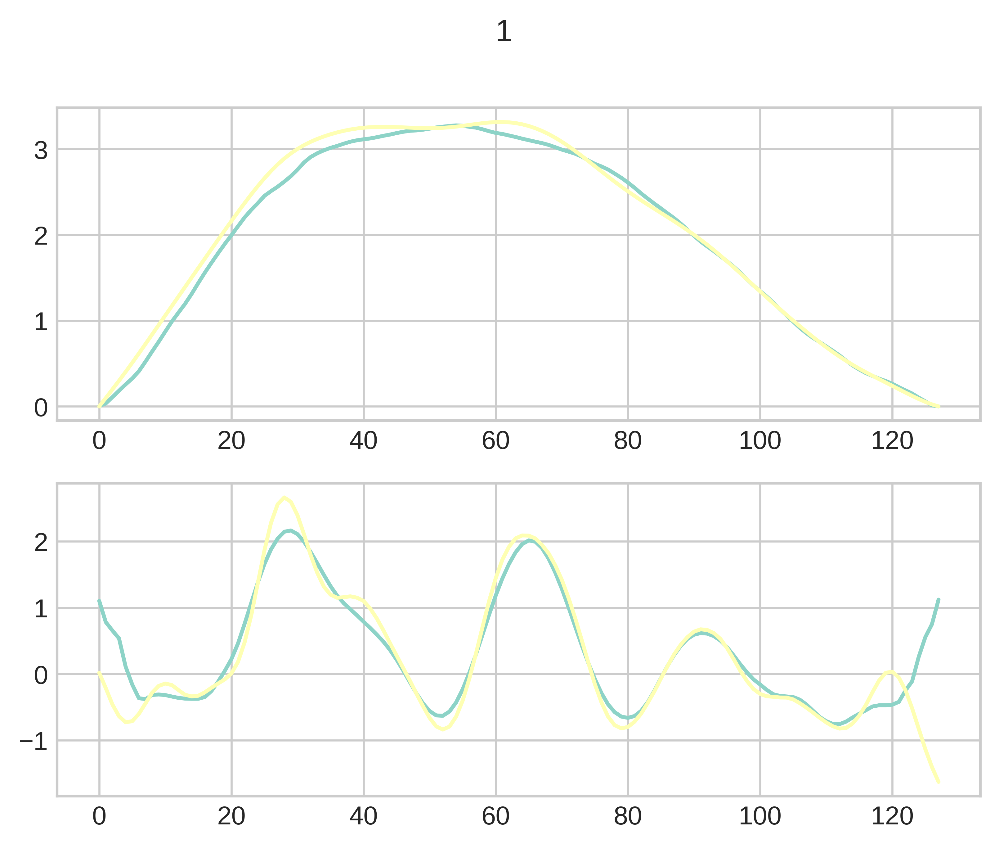

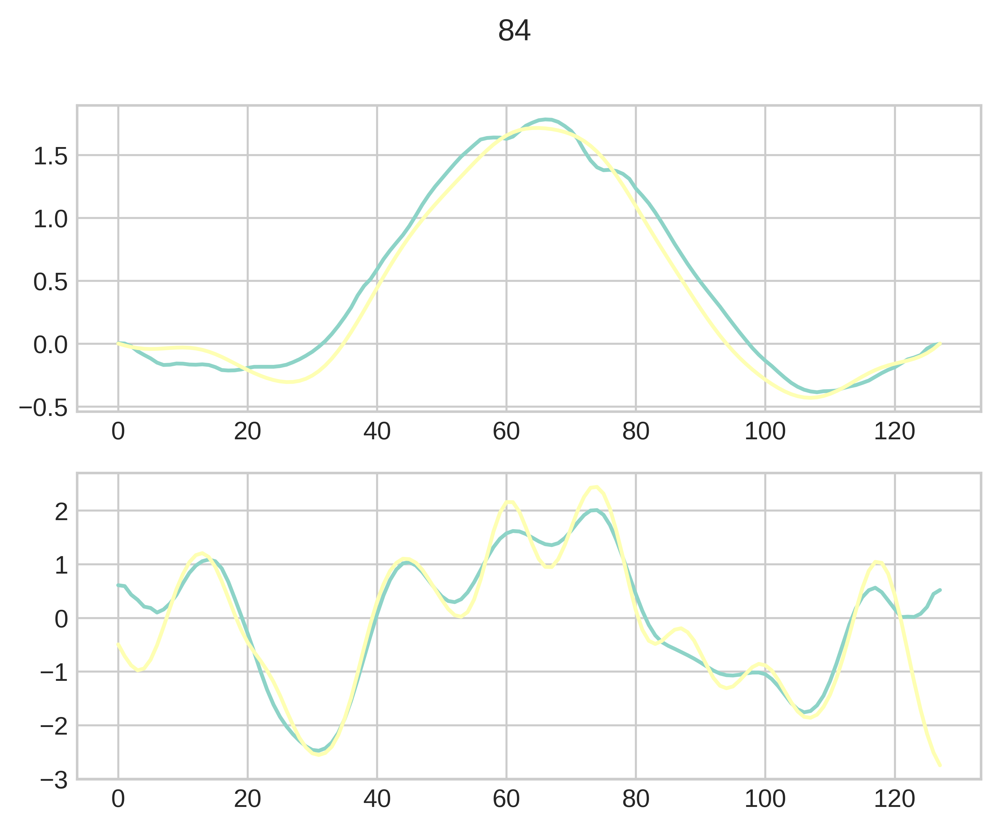

In [18]:
for n in good_ones:
    x0, x1 = ds[n]
    samples = np.load(f"./samples-{n}.npz")
    forward = samples["forward"][-1].mean(axis=0)[1]
    backward = samples["backward"][-1].mean(axis=0)[0]

    fig, ax = plt.subplots(2)

    fig.suptitle(f"{n}")
    ax[0].plot(forward)
    ax[0].plot(x1[1])
    ax[1].plot(backward)
    ax[1].plot(x0[0])

In [19]:

backward_i = samples["backward"]

In [20]:
_, x1 = ds[3]

In [21]:
x1.shape

torch.Size([2, 128])

In [22]:
from functools import cache


@cache
def get_samples(n: int):
    print(f"getting {n}")
    return np.load(f"./samples-{n}.npz")

getting 20
getting 4
getting 1
getting 84


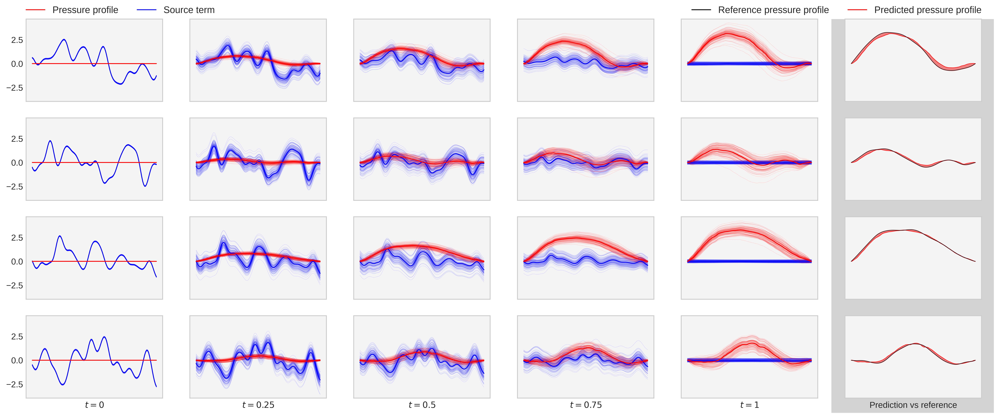

In [23]:
good_ones = [20, 4, 1, 84]

fig, ax = plt.subplots(len(good_ones), 6, sharey=True, sharex=True)
fig.set_figwidth(20)
fig.set_figheight(8)

for i, n in enumerate(good_ones):
    samples_n = get_samples(n)
    forward_n = samples_n["forward"]

    for j, t in enumerate([0, 250, 500, 750, -1]):
        ax[i, j].grid(False)
        ax[i, j].set_xticks([])
        ax[i, j].set_facecolor("whitesmoke")
        for r in range(100):
            ax[i, j].plot(forward_n[t, r, 0], "blue", alpha=0.1, lw=0.5)
            ax[i, j].plot(forward_n[t, r, 1], "red", alpha=0.1, lw=0.5)

        ax[i, j].plot(forward_n.mean(axis=1)[t, 0], "blue", alpha=1.0, lw=1)
        ax[i, j].plot(forward_n.mean(axis=1)[t, 1], "red", alpha=1.0, lw=1)

    ax[i, -1].plot(forward_n.mean(axis=1)[-1, 1], "red", alpha=0.9, lw=0.5)
    ax[i, -1].plot(ds[n][1][1], "black", alpha=1.0, lw=0.5)
    ax[i, -1].fill_between(x=range(128), y1=forward_n.mean(axis=1)
                           [-1, 1], y2=ds[n][1][1], color="lightcoral")
    ax[i, -1].grid(False)
    ax[i, -1].set_xticks([])
    ax[i, -1].set_facecolor("whitesmoke")

ax[-1, 0].set_xlabel("$t=0$")
ax[-1, 1].set_xlabel("$t=0.25$")
ax[-1, 2].set_xlabel("$t=0.5$")
ax[-1, 3].set_xlabel("$t=0.75$")
ax[-1, 4].set_xlabel("$t=1$")
ax[-1, 5].set_xlabel("Prediction vs reference")

ax[0, -1].legend(handles=[
    Line2D([0], [0], color="black", lw=1, label="Reference pressure profile"), Line2D([0], [0], color="red", lw=1, label="Predicted pressure profile")], loc="lower right", fontsize=11, bbox_to_anchor=(1.0, 1.05), ncol=2, borderpad=0, borderaxespad=0)

ax[0, 0].legend(handles=[
    Line2D([0], [0], color="red", lw=1, label="Pressure profile"), Line2D([0], [0], color="blue", lw=1, label="Source term")], loc="lower left", fontsize=11, bbox_to_anchor=(0.0, 1.05), ncol=2, borderpad=0, borderaxespad=0)

fig.canvas.draw()

# Step 2: Get the bounding boxes of axes in the last two columns
# Bounding boxes are in figure coordinates (0 to 1, from bottom-left)
prev_col_ax = ax[0, -2]   # An axis from the second-to-last column
final_col_ax = ax[0, -1]  # An axis from the final column

prev_col_bbox = prev_col_ax.get_position()
final_col_bbox = final_col_ax.get_position()

# Step 3: Calculate the rectangle's starting x-coordinate
# Find the right edge of the previous column and the left edge of the final column
right_edge_prev_col = prev_col_bbox.x1
left_edge_final_col = final_col_bbox.x0

# The starting point is the midpoint of the gutter
rect_x = (right_edge_prev_col + left_edge_final_col) / 2

# The y-coordinate and height are calculated as before
top_right_ax = ax[0, -1]
bottom_right_ax = ax[-1, -1]
top_right_bbox = top_right_ax.get_position()
bottom_right_bbox = bottom_right_ax.get_position()
rect_y = bottom_right_bbox.y0 - 0.03  # A little padding
rect_height = top_right_bbox.y1 - bottom_right_bbox.y0 + 0.03

# The width must now account for the new starting position
rect_width = (final_col_bbox.x1 + 0.01) - rect_x

# Step 4: Create the rectangle patch
rect = patches.Rectangle(
    (rect_x, rect_y), rect_width, rect_height,
    transform=fig.transFigure,
    facecolor='lightgray',
    edgecolor='none',
    zorder=-1
)

# Step 5: Add the rectangle to the figure
fig.add_artist(rect)
fig.savefig("./forward.png", transparent=True, pad_inches=0, bbox_inches='tight', dpi=600)

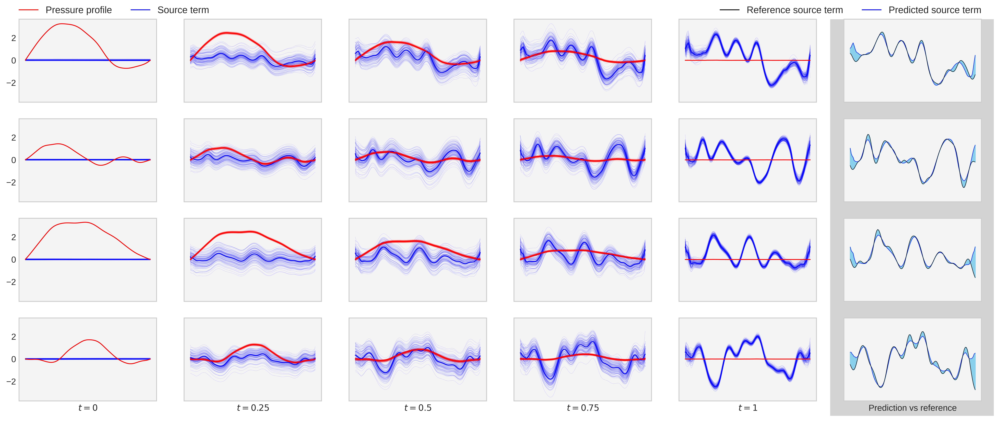

In [24]:
good_ones = [20, 4, 1, 84]

fig, ax = plt.subplots(len(good_ones), 6, sharey=True, sharex=True)
fig.set_figwidth(20)
fig.set_figheight(8)

for i, n in enumerate(good_ones):
    samples_n = get_samples(n)
    backward_n = samples_n["backward"]
    

    for j, t in enumerate([0, 250, 500, 750, -1]):
        ax[i, j].grid(False)
        ax[i, j].set_xticks([])
        ax[i, j].set_facecolor("whitesmoke")
        for r in range(100):
            ax[i, j].plot(backward_n[t, r, 0], "blue", alpha=0.1, lw=0.5)
            ax[i, j].plot(backward_n[t, r, 1], "red", alpha=0.1, lw=0.5)

        ax[i, j].plot(backward_n.mean(axis=1)[t, 0], "blue", alpha=1.0, lw=1)
        ax[i, j].plot(backward_n.mean(axis=1)[t, 1], "red", alpha=1.0, lw=1)

    ax[i, -1].plot(backward_n.mean(axis=1)[-1, 0], "blue", alpha=0.9, lw=0.5)
    ax[i, -1].plot(ds[n][0][0], "black", alpha=1.0, lw=0.5)
    ax[i, -1].fill_between(x=range(128), y1=backward_n.mean(axis=1)[-1, 0], y2=ds[n][0][0], color="skyblue")
    ax[i, -1].grid(False)
    ax[i, -1].set_xticks([])
    ax[i, -1].set_facecolor("whitesmoke")
    
    
ax[-1, 0].set_xlabel("$t=0$")
ax[-1, 1].set_xlabel("$t=0.25$")
ax[-1, 2].set_xlabel("$t=0.5$")
ax[-1, 3].set_xlabel("$t=0.75$")
ax[-1, 4].set_xlabel("$t=1$")
ax[-1, 5].set_xlabel("Prediction vs reference")

ax[0, -1].legend(handles=[
    Line2D([0], [0], color="black", lw=1, label="Reference source term"), Line2D([0], [0], color="blue", lw=1, label="Predicted source term")], loc="lower right", fontsize=11, bbox_to_anchor=(1.0, 1.05), ncol=2, borderpad=0, borderaxespad=0)

ax[0, 0].legend(handles=[
    Line2D([0], [0], color="red", lw=1, label="Pressure profile"), Line2D([0], [0], color="blue", lw=1, label="Source term")], loc="lower left", fontsize=11, bbox_to_anchor=(0.0, 1.05), ncol=2, borderpad=0, borderaxespad=0)

fig.canvas.draw()

# Step 2: Get the bounding boxes of axes in the last two columns
# Bounding boxes are in figure coordinates (0 to 1, from bottom-left)
prev_col_ax = ax[0, -2]   # An axis from the second-to-last column
final_col_ax = ax[0, -1]  # An axis from the final column

prev_col_bbox = prev_col_ax.get_position()
final_col_bbox = final_col_ax.get_position()

# Step 3: Calculate the rectangle's starting x-coordinate
# Find the right edge of the previous column and the left edge of the final column
right_edge_prev_col = prev_col_bbox.x1
left_edge_final_col = final_col_bbox.x0

# The starting point is the midpoint of the gutter
rect_x = (right_edge_prev_col + left_edge_final_col) / 2

# The y-coordinate and height are calculated as before
top_right_ax = ax[0, -1]
bottom_right_ax = ax[-1, -1]
top_right_bbox = top_right_ax.get_position()
bottom_right_bbox = bottom_right_ax.get_position()
rect_y = bottom_right_bbox.y0 - 0.03  # A little padding
rect_height = top_right_bbox.y1 - bottom_right_bbox.y0 + 0.03

# The width must now account for the new starting position
rect_width = (final_col_bbox.x1 + 0.01) - rect_x

# Step 4: Create the rectangle patch
rect = patches.Rectangle(
    (rect_x, rect_y), rect_width, rect_height,
    transform=fig.transFigure,
    facecolor='lightgray',
    edgecolor='none',
    zorder=-1
)

# Step 5: Add the rectangle to the figure
fig.add_artist(rect)

fig.savefig("./backward.png", transparent=True, pad_inches=0, bbox_inches='tight', dpi=600)

In [25]:
forward_n.shape

(1000, 100, 2, 128)

In [26]:
# forward_n = forward_n[:, :, 1, :]

In [37]:
fig, ax = plt.subplots()
lines_blue = [ax.plot([], [], "b", alpha=0.1)[0] for _ in range(forward_n.shape[1])]
mean_line_blue = ax.plot([], [], "b", alpha=0.8, lw=2.0)[0]
lines_red = [ax.plot([], [], "r", alpha=0.1)[0] for _ in range(forward_n.shape[1])]
mean_line_red = ax.plot([], [], "r", alpha=0.8, lw=2.0)[0]

ax.set_xlim(0, forward_n.shape[3] - 1)
ax.set_ylim(-3, 3)

def init():
    for line in lines_blue:
        line.set_data([], [])
    for line in lines_red:
        line.set_data([], [])
    return lines_blue


def update(frame_index):
    display(frame_index)
    x = np.arange(forward_n.shape[3])
    for line_blue, line_red, y in zip(lines_blue, lines_red, forward_n[3 * frame_index]):
        line_blue.set_data(x, y[0])
        line_red.set_data(x, y[1])

    
    mean_line_blue.set_data(x, forward_n[3 * frame_index, :, 0].mean(axis=0))
    mean_line_red.set_data(x, forward_n[3 * frame_index, :, 1].mean(axis=0))
    return lines_blue


anim = animation.FuncAnimation(
    fig, update, frames=forward_n.shape[0] // 3,
    init_func=init, blit=True, interval=1
)

# Save the animation as an MP4 file (1 ms per frame → 1000 fps)

anim.save('./generation.gif', writer="imagemagick", fps=60)

plt.close(fig)

MovieWriter imagemagick unavailable; using Pillow instead.


0

1

2

3

4

5

6

7

8

9

10

11

12

13

14

15

16

17

18

19

20

21

22

23

24

25

26

27

28

29

30

31

32

33

34

35

36

37

38

39

40

41

42

43

44

45

46

47

48

49

50

51

52

53

54

55

56

57

58

59

60

61

62

63

64

65

66

67

68

69

70

71

72

73

74

75

76

77

78

79

80

81

82

83

84

85

86

87

88

89

90

91

92

93

94

95

96

97

98

99

100

101

102

103

104

105

106

107

108

109

110

111

112

113

114

115

116

117

118

119

120

121

122

123

124

125

126

127

128

129

130

131

132

133

134

135

136

137

138

139

140

141

142

143

144

145

146

147

148

149

150

151

152

153

154

155

156

157

158

159

160

161

162

163

164

165

166

167

168

169

170

171

172

173

174

175

176

177

178

179

180

181

182

183

184

185

186

187

188

189

190

191

192

193

194

195

196

197

198

199

200

201

202

203

204

205

206

207

208

209

210

211

212

213

214

215

216

217

218

219

220

221

222

223

224

225

226

227

228

229

230

231

232

233

234

235

236

237

238

239

240

241

242

243

244

245

246

247

248

249

250

251

252

253

254

255

256

257

258

259

260

261

262

263

264

265

266

267

268

269

270

271

272

273

274

275

276

277

278

279

280

281

282

283

284

285

286

287

288

289

290

291

292

293

294

295

296

297

298

299

300

301

302

303

304

305

306

307

308

309

310

311

312

313

314

315

316

317

318

319

320

321

322

323

324

325

326

327

328

329

330

331

332